<a href="https://colab.research.google.com/github/therealericsun/Deep_Arpes/blob/main/Deep_Arpes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installations and Drive Loading

In [ ]:
!pip3 install -U scikit-learn
!pip3 install -U matplotlib
!pip3 install yellowbrick
!pip3 install numba

import os
os.kill(os.getpid(), 9)

In [ ]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

# Deep Autoencoder Training

Artificial Data Generation

In [1]:
import numpy as np
from cv2 import blur as b
import numba
from math import pi, cos, sin, log
import random
import cv2
import time

@numba.jit(nopython=True)
def TBM(kx,ky):
  t0 = 0.126
  tt = -0.053
  tbi = 0.008
  Ek = -2*t0*(cos(kx) + cos(ky)) - 4*tt*cos(kx)*cos(ky)
  Ebi = -2*tbi*(cos(kx) - cos(ky))**2
  return Ek+Ebi

@numba.jit(nopython=True)
def Imsig(x):
  # i = -0.06
  i = -0.1
  return i

@numba.jit(nopython=True)
def AKW(kx,ky,w):
	return -Imsig(w)/(pi*((w-TBM(kx,ky))**2+(Imsig(w))**2))
 
# Calculate EDC cut
@numba.jit(nopython=True)
def show(x, y, w_range, f, c, k_r = 256, w_r = 256):
  space = np.zeros((k_r, w_r))
  x_space = np.linspace(x[0], y[0], k_r)
  y_space = np.linspace(x[1], y[1], k_r)
  w_space = np.linspace(w_range[0], w_range[1], w_r)
  bound_cutoff = np.random.uniform(0.6, 0.95)
  for k in range(k_r):
    for w in range(w_r):
      if c == 1:
        if w/(w_r) < bound_cutoff:
          space[w,k] = AKW(x_space[k],y_space[k],w_space[w])
        else:
          space[w,k] = 0.
      else:
        space[w,k] = AKW(x_space[k],y_space[k],w_space[w])
  updown = np.random.randint(2) 
  if updown == 1 and f == 1: # f controlls flipping
    space = np.flipud(space)
  
  return space/space.max()

@numba.jit(nopython=True)
def count_epsilon(mat, e = 0.01):
  c = 0
  x, y = mat.shape
  for i in range(x):
    for j in range(y):
      if mat[i,j] < e:
        c = c+1
  return c

@numba.jit(nopython=True)
def count_blackrow(mat, e = 0.01):
  c = 0
  x, y = mat.shape
  for i in range(2*x//3,x):
    for j in range(y):
      if mat[i,j] < e:
        c = c + 1
  return c

def get_fermi(mat, e = 0.3):
  c = 0
  x, y = mat.shape
  for i in range(x):
    for j in range(y):
      if mat[i,j] > e:
        return c
    c = c + 1
  return 0
 

# Generate random cut direction with length 2l, slope, center c, and angle range w
# Flip sometimes randomnly flips the image
# def gen(n, l_range = (4,8), slope_range = (-pi, pi), c_range = (-1, 1), w_range = (0.6, 1), flip = True,\
#         w_c_range = (-0.5, -0.2), cutoff = False, cuttoff_range = (12,24)):
def gen(n, l_range = (3,6), slope_range = (-pi, pi), c_range = (pi-0.4, pi+0.4), w_range = (0.5, 1.0), \
  w_c_range = (-0.5, -0.2), flip = False, cutoff = False, cuttoff_range = (12,24)):
  arr = []
  c_vals = np.array([np.random.uniform(c_range[0], c_range[1], 2) for x in range(n)])
  slope = np.random.uniform(slope_range[0], slope_range[1], n)
  l = np.random.uniform(l_range[0], l_range[1], n)
  x_vals, y_vals = [], []
  for i in range(n):
    cosine, sine = cos(slope[i]), sin(slope[i])
    x_vals.append([-cosine*l[i]+c_vals[i,0], -sine*l[i]+c_vals[i,1]])
    y_vals.append([cosine*l[i]+c_vals[i,0], sine*l[i]+c_vals[i,1]])

  w_vals = np.array([[x,x+np.random.uniform(w_range[0], w_range[1])] for x in np.random.uniform(w_c_range[0], w_c_range[1],n)])
  f = 1 if flip == True else 0
  c = 1 if cutoff == True else 0

  for i in range(n):
    arr.append(np.flipud(show(x_vals[i],y_vals[i], w_vals[i], f, c)))
  return np.array(arr)

# stack multiple curves
def multigen(n, edc_count, l_range = (4,8), slope_range = (-pi, pi), c_range = (-1, 1), \
             w_range = (0.4, 1), flip = True, factors = None):
  if factors == None:
    f = [1]*edc_count
  else:
    f = factors
  results = np.zeros((n, 256, 256))
  for i in range(edc_count):
    results += f[i]*gen(n, l_range, slope_range, c_range, w_range, flip)
  return results

In [ ]:


# x_train = np.concatenate([multigen(6000, 1), multigen(3000, 2, factors = [1, 0.5]), multigen(3000, 3, factors = [1, 0.5, 0.5])])
# x_test = np.concatenate([multigen(150, 1), multigen(150, 2, factors = [1, 0.5]), multigen(150, 3, factors = [1, 0.5, 0.5])])



# x_train = np.concatenate([gen(3000))])
# x_test = gen(100)


x_train = gen(6000)
x_test = gen(100)


np.random.shuffle(x_train)
np.random.shuffle(x_test)

h, w = 256,256
blur = lambda img : b(img, (10,10) ,cv2.BORDER_DEFAULT)
reshape = lambda img : np.reshape(img, ((len(img), h, w, 1)))
norm = lambda img: cv2.resize(img, (256, 256))/cv2.resize(img, (256, 256)).max()

/usr/local/lib/python3.7/dist-packages/numba/core/ir_utils.py:2031: NumbaPendingDeprecationWarning: 
Encountered the use of a type that is scheduled for deprecation: type 'reflected list' found for argument 'x' of function 'show'.

For more information visit https://numba.pydata.org/numba-doc/latest/reference/deprecation.html#deprecation-of-reflection-for-list-and-set-types

File "<ipython-input-26-44b2f950ced0>", line 30:
@numba.jit(nopython=True)
def show(x, y, w_range, f, c, k_r = 256, w_r = 256):
^

  warnings.warn(NumbaPendingDeprecationWarning(msg, loc=loc))
/usr/local/lib/python3.7/dist-packages/numba/core/ir_utils.py:2031: NumbaPendingDeprecationWarning: 
Encountered the use of a type that is scheduled for deprecation: type 'reflected list' found for argument 'y' of function 'show'.

For more information visit https://numba.pydata.org/numba-doc/latest/reference/deprecation.html#deprecation-of-reflection-for-list-and-set-types

File "<ipython-input-26-44b2f950ced0>", line 30:
@n

Add noise (possion and gaussian)

In [ ]:
def norm_batch(imgs):
  return np.array([norm(img) for img in imgs])

# GPU accerlated fast calculation
@numba.jit(nopython=True)
def _norm_ln(img):
  x,y = img.shape
  ret = np.zeros((x,y))
  for i in range(x):
    for j in range(y):
      ret[i,j] = log(img[i,j]+1)
  return ret

def norm_ln(img):
  x = cv2.resize(_norm_ln(img), (256,256))
  return x/x.max()

# GPU accerlated fast calculation
@numba.jit(nopython=True)
def _norm_ln_batch(imgs):
  n,x,y = imgs.shape
  ret = np.zeros((n,x,y))
  for t in range(n):
    ret[t] = _norm_ln(imgs[t])
  return ret

def norm_ln_batch(imgs):
  x = np.array([cv2.resize(img, (256,256)) for img in _norm_ln_batch(imgs)])
  return x/x.max()

# noise_factor changes noise level, hide_factor reduces curve visibility, b for blur
# noise factor = 0.25, hide factor = 0.25 for BSCCO
# n_f = 0.5, h_f = 1 for TaSe2
# def make_noise(imgs, noise_factor = 0.2, hide_factor = 0.8, b = True):
def make_noise(imgs, noise_factor = 0.8, hide_factor = 1., b = True):
  x = reshape(np.array(list(map(blur, imgs)))) if b else reshape(imgs)
  x = hide_factor*x + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x.shape)
  return np.clip(x, 0., 1.)


# @numba.jit(nopython=True)
def poisson(imgs, noise_factor = 0.4, hide_factor = 0.7):
  results = []
  # for i in range(len(imgs)):
  #   results.append(noise_factor*imgs[i] + hide_factor*np.random.poisson(imgs[i]))
  for i in range(len(imgs)):
     results.append(hide_factor*np.random.poisson(imgs[i]))
  return np.array(results)


def make_p_noise(imgs, noise_factor = 0.4, hide_factor = 0.4, b = True):
  x = poisson(imgs)
  x = reshape(np.array(list(map(blur, x)))) if b else reshape(x)
  return np.clip(x, 0., 1.)

# noisy = lambda img : make_noise(make_p_noise(img, hide_factor = 0.5), b = False, noise_factor = 0.8, hide_factor=1.0)

noisy = lambda img : make_noise(make_p_noise(img, hide_factor = 0.5), b = True, noise_factor = 0.3, hide_factor=.4)

In [ ]:
x_train = reshape(x_train)
x_test = reshape(x_test)

x_train_noisy = noisy(x_train)
x_test_noisy = noisy(x_test)

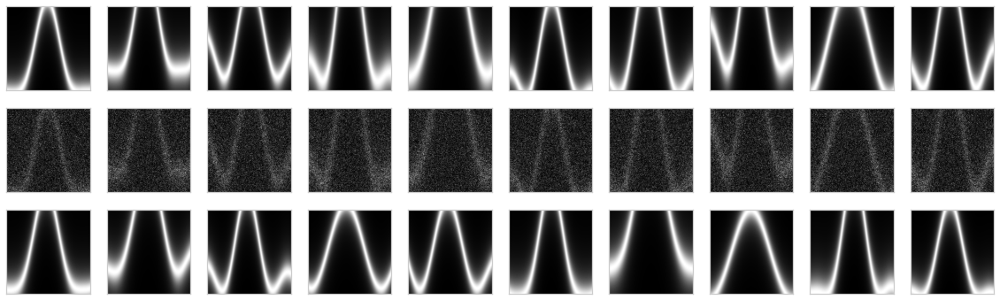

In [ ]:
import matplotlib.pyplot as plt

n = 10

# d = norm_ln_batch(data[12])
# d = norm_batch(data[14])

try:
  plt.figure(figsize=(20, 6))
  for i in range(1, n + 1):
      ax = plt.subplot(3, n, i)
      plt.imshow(x_train[i].reshape(h, w))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      ax = plt.subplot(3, n, i+n)
      plt.imshow(x_train_noisy[i].reshape(h, w))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      ax = plt.subplot(3, n, i+2*n)
      plt.imshow(x_test[i].reshape(h, w))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
  plt.show()
except:
  pass

Set up model and train epochs

In [ ]:
import tensorflow as tf
import keras
from keras.metrics import mean_squared_error
from keras import layers


x_train = reshape(x_train)
x_test = reshape(x_test)

x_train_noisy = noisy(x_train)
x_test_noisy = noisy(x_test)

def SSIMLoss(y_true, y_pred):
  return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, 1.0))

def joint_MAE_SSIMLoss(y_true, y_pred):
  return 0.8*mean_squared_error(y_true, y_pred) + 0.2*SSIMLoss(y_true, y_pred)

input_img = keras.Input(shape=(h, w, 1))

x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((4, 4), padding='same')(x)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

# At this point the representation is (8, 8, 32)

x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((4, 4))(x)
decoded = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss=joint_MAE_SSIMLoss)
autoencoder.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d_9 (Conv2D)           (None, 256, 256, 64)      640       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 64, 64, 64)        36928     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 32, 32, 64)       0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 32, 32, 32)        1846

In [ ]:
from keras.callbacks import TensorBoard
import gc

autoencoder.fit(x_train_noisy, x_train,
                epochs=30,
                batch_size=100,
                shuffle=True,
                validation_data=(x_test_noisy, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/autoencoder', histogram_freq=0, write_graph=False)])

autoencoder_fitted = True

Epoch 1/30
60/60 [==============================] - 9s 140ms/step - loss: 0.1577 - val_loss: 0.0794
Epoch 2/30
60/60 [==============================] - 8s 134ms/step - loss: 0.0468 - val_loss: 0.0250
Epoch 3/30
60/60 [==============================] - 8s 134ms/step - loss: 0.0221 - val_loss: 0.0166
Epoch 4/30
60/60 [==============================] - 8s 134ms/step - loss: 0.0157 - val_loss: 0.0129
Epoch 5/30
60/60 [==============================] - 8s 135ms/step - loss: 0.0128 - val_loss: 0.0137
Epoch 6/30
60/60 [==============================] - 8s 134ms/step - loss: 0.0114 - val_loss: 0.0105
Epoch 7/30
60/60 [==============================] - 8s 135ms/step - loss: 0.0101 - val_loss: 0.0098
Epoch 8/30
60/60 [==============================] - 8s 134ms/step - loss: 0.0095 - val_loss: 0.0091
Epoch 9/30
60/60 [==============================] - 8s 134ms/step - loss: 0.0091 - val_loss: 0.0090
Epoch 10/30
60/60 [==============================] - 8s 134ms/step - loss: 0.0089 - val_loss: 0.0080

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/tmp/autoencoder

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 711), started 0:19:20 ago. (Use '!kill 711' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
from keras.models import save_model
from os import chdir
chdir('/content')
save_model(autoencoder, "audoencoder.h5")

# Setup (run once) Restart Runtime First

In [ ]:
from numpy.core.numeric import count_nonzero
import numpy as np
import h5py
import os
from math import log, sqrt
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib import colors, cm, offsetbox
from mpl_toolkits.mplot3d import Axes3D, proj3d
from mpl_toolkits.axes_grid1 import ImageGrid
import time
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances_argmin_min
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from itertools import permutations
import numba
import random
import cv2

@numba.jit(nopython=True)
def sum_all(x_s, y_s, data):
  clean = np.zeros((x_s, y_s))
  for x in range(x_s):
    for y in range(y_s):
      clean[x,y] = np.sum(data[x,y])
  return clean

def img_is_color(img):
    if len(img.shape) == 3:
        c1, c2, c3 = img[:, : , 0], img[:, :, 1], img[:, :, 2]
        if (c1 == c2).all() and (c2 == c3).all():
            return True
    return False


def show_image_list(list_images, list_titles=None, list_cmaps=None, grid=False, num_cols=3, figsize=(15, 9), title_fontsize=20):
    assert isinstance(list_images, list)
    assert len(list_images) > 0
    assert isinstance(list_images[0], np.ndarray)

    if list_titles is not None:
        assert isinstance(list_titles, list)
        assert len(list_images) == len(list_titles), '%d imgs != %d titles' % (len(list_images), len(list_titles))

    if list_cmaps is not None:
        assert isinstance(list_cmaps, list)
        assert len(list_images) == len(list_cmaps), '%d imgs != %d cmaps' % (len(list_images), len(list_cmaps))

    num_images  = len(list_images)
    num_cols    = min(num_images, num_cols)
    num_rows    = int(num_images / num_cols) + (1 if num_images % num_cols != 0 else 0)

    # Create a grid of subplots.
    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    
    # Create list of axes for easy iteration.
    if isinstance(axes, np.ndarray):
        list_axes = list(axes.flat)
    else:
        list_axes = [axes]

    for i in range(num_images):
        img    = list_images[i]
        title  = list_titles[i] if list_titles is not None else 'Image %d' % (i)
        cmap   = list_cmaps[i] if list_cmaps is not None else (None if img_is_color(img) else 'gray')
        list_axes[i].imshow(img, cmap=cmap)
        list_axes[i].set_title(title, fontsize=title_fontsize) 
        list_axes[i].grid(grid)
        list_axes[i].axis("off")

    for i in range(num_images, len(list_axes)):
        list_axes[i].set_visible(False)

    fig.tight_layout()
    _ = plt.show()




# creats a class of obejcts after applying K-means/PCA
class Clustered:
  def __init__(self, ARPES, fitted_model, raw_cords, dtype, percents): # ARPES is the ARPES_data object passed through
    self.ARPES = ARPES
    self.model = fitted_model
    self.labels = fitted_model.labels_
    self.centers = fitted_model.cluster_centers_
    self.cords = raw_cords
    self.dtype = dtype
    self.percents = percents

  def show(self, smooth = False, sampling = 1000, n_neighbors = 5):
    if smooth:
      values = self.ARPES.knn(self.labels, sampling, n_neighbors) 
    else:
      values = np.reshape(self.labels, (self.ARPES.x_s, self.ARPES.y_s)).T
    ARPES_data.plot_graph(values,'X (mm)', 'Y (mm)', \
                      [self.ARPES.xmin, self.ARPES.xmax, self.ARPES.ymin, self.ARPES.ymax], interpolation= "none", \
                      cmap = 'YlOrRd', title = f'K-means clustering for {self.dtype}', \
                      pad = 15, cbar = False)


  def show_centers(self, encode = False, enhance = False):
    print("Finding representative points...")
    closest, _ = pairwise_distances_argmin_min(self.centers, self.cords)
    print("Plotting...")
    num_centers = len(self.centers)
    rows, cols = num_centers//3+1, 3
    fig = plt.figure(figsize=(10, 6))
    points = [(i%self.ARPES.x_s, i//self.ARPES.x_s) for i in closest]
    if encode:
      values = [cv2.resize(ARPES_data.get_decoding(self.ARPES.data[p[0], p[1]], enhance), (256,256)) for p in points]
    else:
      values = [cv2.resize(self.ARPES.data[p[0], p[1]],  (256,256)) for p in points]
    titles = [f"Cluster {c}" for c in range(len(values))]
    show_image_list(values, titles, ["magma"]*len(titles))


  def show_double_cluster(self, cluster, enhance = False, line = True, epsilon = 0.4):
    points = []
    for n in range(len(self.labels)):
      if self.labels[n] == cluster:
        points.append([n%self.ARPES.x_s, n//self.ARPES.x_s])
    
    points = random.sample(points, 5)
    fig = plt.figure(figsize=(6, 10))
    fig.suptitle(f'Cluster {cluster}', fontsize=20)
    fig.subplots_adjust(top=1.1)

    grid = ImageGrid(fig, 111, 
                 nrows_ncols=(5, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )
    
    for p in range(len(grid)//2):
      values = cv2.resize(self.ARPES.data[points[p][0], points[p][1]], (256,256))
      arped = ARPES_data.get_decoding(values, enhance)
      grid[2*p].imshow(arped, cmap = 'magma')
      if line:
        fermi = get_fermi(arped, epsilon)
        grid[2*p].axhline(y=fermi, color='red', alpha=0.5, linewidth=2)
        grid[2*p].axhline(y=fermi+43, color='green', alpha=0.3, linewidth=10)
      grid[2*p+1].imshow(values, cmap = 'magma')
      grid[2*p+1].grid(False)
      grid[2*p+1].axis('off')
      grid[2*p].grid(False)
      grid[2*p].axis('off')
    fig.tight_layout()
    fig.subplots_adjust(top=0.92)
    plt.show()
    plt.clf()

  def show_cluster(self, cluster, encode = False, enhance = False):
    print(f"Getting cluster {cluster}...")
    if cluster > len(self.centers)-1:
      print("Cluster is out of range.")
      return None
    points = []
    for n in range(len(self.labels)):
      if self.labels[n] == cluster:
        points.append([n%self.ARPES.x_s, n//self.ARPES.x_s])
    
    points = random.sample(points, 15)
    fig = plt.figure(figsize=(6, 10))
    fig.suptitle(f'Cluster {cluster}', fontsize=12)
    fig.subplots_adjust(top=0.8)

    grid = ImageGrid(fig, 111, 
                 nrows_ncols=(5, 3),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )
    
    for p in range(len(grid)):
      if p < len(points):
        values = cv2.resize(self.ARPES.data[points[p][0], points[p][1]], (256,256))
        if encode:
          grid[p].imshow(ARPES_data.get_decoding(values, enhance), cmap = 'magma')
        else: 
          grid[p].imshow(values, cmap = 'magma')

      grid[p].grid(False)
      grid[p].axis('off')

    fig.tight_layout()
    plt.show()
    plt.clf()



  def show_distribution(self, cmap='YlOrRd'):
    scatter_x, scatter_y = self.cords[:,:2].T
    percents = self.percents
    group = self.labels

    clr_range = np.linspace(0, 1, group.max()+1)

    fig, ax = plt.subplots()
    for g in np.unique(group):
        ix = np.where(group == g)
        ax.scatter(scatter_x[ix], scatter_y[ix], c = cm.get_cmap(cmap)(clr_range[g]),\
                   edgecolors='black', label = f'Cluster {g}', s = 100)
    ax.legend(frameon=True)
    print(f"Accounting for {sum(percents[:2])} of varience.")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2") 
    plt.show()

    

  def show_3d(self, cmap='YlOrRd', show_cent=False):
    scatter_x, scatter_y, scatter_z = self.cords[:,:3].T
    percents = self.percents
    group = self.labels

    clr_range = np.linspace(0, 1, group.max()+1)

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(projection='3d')


    for g in np.unique(group):
        ix = np.where(group == g)
        ax.scatter(scatter_x[ix], scatter_y[ix], scatter_z[ix], c = cm.get_cmap(cmap)(clr_range[g]),\
                   edgecolors='black', label = f'Cluster {g}', s = 100)
        
    ax.legend(frameon=True)
    ax.set_xlabel("Principal Component 1", labelpad = 10.)
    ax.set_ylabel("Principal Component 2", labelpad = 10.)
    ax.set_zlabel("Principal Component 3", labelpad = 10.)


    if show_cent:
      ax2 = fig.add_subplot(111,frame_on=False) 
      ax2.axis("off")
      ax2.axis([0,1,0,1])

      # below solution from ImportanceOfBeingErnest on Github
      def proj(X, ax1, ax2):
        x,y,z = X
        x2, y2, _ = proj3d.proj_transform(x,y,z, ax1.get_proj())
        return ax2.transData.inverted().transform(ax1.transData.transform((x2, y2)))
      
      def image(ax,arr,xy):
        """ Place an image (arr) as annotation at position xy """
        im = offsetbox.OffsetImage(arr, zoom=0.6)
        im.image.axes = ax
        ab = offsetbox.AnnotationBbox(im, xy, xybox=(0., -80.),
                            xycoords='data', boxcoords="offset points",
                            pad=0.3, arrowprops=dict(arrowstyle='-|>', color='black'))
        ax.add_artist(ab)

      norm = lambda x : x/x.max()

      closest, _ = pairwise_distances_argmin_min(self.centers, self.cords)
      points = [(i%self.ARPES.x_s, i//self.ARPES.x_s) for i in closest]
      images = np.array([cv2.resize(self.ARPES.data[p[0], p[1]],  (64,64)) for p in points])
      values = [cm.magma(norm(i)) for i in images] # all the images

      xs, ys, zs = np.array([self.cords[:, :3][c] for c in closest]).T


      for s in zip(xs,ys,zs, values):
        x,y = proj(s[:3], ax, ax2)
        image(ax2,s[3],[x,y])

    print(f"Accounting for {sum(percents[:3])} of varience.")
    plt.show()


  def get_accuracy(self, gt):
    assert len(gt.shape) == 2
    vals = []
    tests = list(permutations(range(int(gt.max())+1)))
    print(tests)
    labelswitch = np.zeros(gt.shape)
    x, y = gt.shape
    for label in tests:
      for i in range(x):
        for j in range(y):
          labelswitch[i,j] = label[int(np.reshape(self.labels, (30, 30), order = 'F')[i,j])]
      vals.append(np.count_nonzero(gt-labelswitch))
    return round(1-min(vals)/(x*y), 3)



  def PCA_on_autoencoder(self, bad_label = 0):
    pca_model = PCA(0.95)
    pca_model2 = PCA(0.95)
    cleaned_cords = []
    raw_cords = []
    for cord in range(len(self.labels)):
      if self.labels[cord] != bad_label:
        cleaned_cords.append(self.cords[cord])
        raw_cords.append(1)
      else:
        raw_cords.append(0)
    cc = np.array(cleaned_cords)
    t = ((pca_model2.fit_transform(cc)).T[0]).T
    final = []
    counter = 0
    for i in range(len(raw_cords)):
      if raw_cords[i] == 0:
        final.append(0)
      else:
        final.append(t[counter])
        counter += 1
    return np.array(final)
    
  def zerocount(self, bad_label, epsilon = 0.5):
    x_s = self.ARPES.x_s
    y_s = self.ARPES.y_s
    map = np.zeros((x_s,y_s))
    lab = np.reshape(self.labels, (x_s, y_s))
    for x in range(x_s):
      for y in range(y_s):
        if lab[x,y] != bad_label:
          map[x,y] = get_fermi(ARPES_data.get_decoding(self.ARPES.data[y,x], True), epsilon)
        else:
          map[x,y] = 0
    return map


# create custom class for ARPES data
class ARPES_data:
  def __init__(self, data, xmin, xmax, ymin, ymax, KE_min, KE_max, \
               Theta_min, Theta_max):
    self.data = data
    self.x_s, self.y_s, self.Ke_s, self.Ang_s = data.shape # also loads shape initially
    self.xmin = xmin
    self.xmax = xmax
    self.ymin = ymin
    self.ymax = ymax
    self.KE_min = KE_min
    self.KE_max = KE_max
    self.Theta_min = Theta_min
    self.Theta_max = Theta_max


  # enables the grabbing of data values by subscripting
  def __getitem__(self, key): 
    return self.data[key]


  # makes default representation the raw data in matrix form
  def __repr__(self): 
    return self.data


  # plot the data using this wrapper function (notes: everything follows ply, Autosqure automatically scales the thing)
  # specifaiclly used for matricies
  @staticmethod 
  def plot_graph(values, xlabel, ylabel, ext, xbins=6, ybins=6, \
                 interpolation = "lanczos", aspect=1, cmap = "magma",\
                 title = "", pad = 0, Autosquare = False, cbar = True, show = True,
                 axis = True): 
    fig = plt.figure(figsize=(6, 6))
    print("Drawing graph...")
    if Autosquare: # automatically make thing square
      aspect = (ext[1]-ext[0])/(ext[3]-ext[2])
    
    fig, ax = plt.subplots()
    plt.imshow(values, extent = ext, interpolation = interpolation, \
               aspect=aspect, cmap = cmap)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel) 
    plt.title(title, pad=pad) 
    plt.grid(False)
    if not axis:
      plt.axis('off')
    if cbar:
      plt.colorbar()
    else: # create custom legend
      elements = []
      n_clusters = np.amax(values)+1
      clr_range = np.linspace(0, 1, n_clusters)
      for cluster in range(n_clusters):
        elements.append(Patch(label = f"Cluster {cluster}", facecolor = cm.get_cmap(cmap)(clr_range[cluster])))
      ax.legend(handles = elements, loc = 'lower right', bbox_to_anchor=(1.3, 0.4), frameon=True)
    if show:
      plt.show()
      plt.clf()

  # transform raw data to processable cv2 img (1-d array form when flattened)
  def clust_transform(self, img, dim =(256,256)):
    img = cv2.resize(img, dim) # create greyscale cv2 img
    img = np.reshape(img, (1,-1))[0] # create 1xn array
    return img

  # creates graph of the object integrated over all angles and energies
  def show(self, Interpolation="none"): 
    t_0 = time.time()
    print("Formating data for graph...") # sum over all angles and values
    self.plot_graph(sum_all(self.x_s, self.y_s, self.data), 'X (mm)', 'Y (mm)', [self.xmin, self.xmax, self.ymin, self.ymax], interpolation = Interpolation)

  @staticmethod
  def get_encoding(img, enhance = False):
    if 'autoencoder_fitted' not in globals():
      print("Must fit autoencoder first.")
      return None
    encoder = keras.Model(input_img, encoded)
    val = np.array([norm_ln(img)]) if enhance else np.array([norm(img)])
    return np.reshape(encoder.predict(val), (64,32))

  @staticmethod
  def get_batch(imgs, enhance = False):
    if 'autoencoder_fitted' not in globals():
      print("Must fit autoencoder first.")
      return None
    encoder = keras.Model(input_img, encoded)
    val = norm_ln_batch(imgs) if enhance else norm_batch(imgs)
    val = np.array([np.reshape(n, (256,256, 1)) for n in val])
    return encoder.predict_on_batch(val)


  @staticmethod
  def get_decoding(img, enhance = False):
    if 'autoencoder_fitted' not in globals():
      print("Must fit autoencoder first.")
      return None
    val = np.array([norm_ln(img)]) if enhance else np.array([norm(img)])
    return np.reshape(autoencoder.predict(val), (256,256))


  # shows deep-learning embedding
  def show_encoding(self, l_x, l_y):
    print(f"Formating encoding for point ({l_x},{l_y})...")
    graph = cv2.resize(self.get_encoding(self.data[l_x,l_y]), (256,256))
    self.plot_graph(graph,'', '', \
                    [0, 1, 0, 1], aspect = 1, \
                    title = f"Cords: ({l_x},{l_y})", pad = 15, axis = False,
                    cmap = 'gray',  interpolation = "none")

  def show_decoding(self, l_x, l_y, enhance = False):
    print(f"Formating decoding for point ({l_x},{l_y})...")
    decode = self.get_decoding(self.data[l_x,l_y], enhance = True)
    graph = cv2.resize(decode, (256,256))*255
    self.plot_graph(graph,'', '', \
                    [0, 1, 0, 1], aspect = 1, \
                    title = f"Cords: ({l_x},{l_y})", pad = 15, axis = False,
                    cmap = 'gray',  interpolation = "none")

  # plots angle-KE data at specific l_x l_y cord
  def show_point(self, l_x, l_y, mode = 'default'): 
    print(f"Formating data for point ({l_x},{l_y})...")
    graph = self.data[l_x, l_y] # look at the l_x, l_y point of the data

    if mode=='ln': # ln compression if needed
      vlog = lambda i : log(i+1)
      mat_log = np.vectorize(vlog)
      graph = mat_log(graph)
    elif mode=='sqrt': # quadretic compression if needed
      vlog = lambda i : sqrt(i)
      mat_log = np.vectorize(vlog)
      graph = mat_log(graph)
    elif mode!='default': # check cases
      print('Mode must be "default", "ln", or "sqrt". Leave blank for default.')
      return None
  
    self.plot_graph(graph,'Theta (deg)', 'KE (eV)', \
                    [self.Theta_min, self.Theta_max, self.KE_min, self.KE_max], aspect = 40, \
                    title = f"Cords: ({l_x},{l_y})", pad = 15, Autosquare = True)


  # integrate along energy (returns angle-point-intensity graph)
  def integrate_energy(self): 
    print("Integrating energy...")
    graph = np.zeros((self.x_s*self.y_s, self.Ang_s))
    for x in range(self.x_s):
      for y in range(self.y_s):
        graph[self.x_s*y+x] = self.data[x,y].sum(0) # replace each row with compressed data row
    return graph


  # integrate along angle (returns energy-point-intensity graph)
  def integrate_angle(self): 
    print("Integrating angle...")
    graph = np.zeros((self.x_s*self.y_s, self.Ke_s))
    for x in range(self.x_s):
      for y in range(self.y_s):
        graph[self.x_s*y+x] = self.data[x,y].sum(1) # replace each row with compressed data row
    return graph

  # autoencoder over surface 
  def autoencode(self, enhance=False):
    print("Autoencoding data...")
    flat = np.concatenate(np.swapaxes(self.data, 0, 1))
    graph = np.reshape(self.get_batch(flat, enhance=enhance), (self.x_s * self.y_s, 2048))
    return graph

  # graph the energy data in terms of the indivisual points
  def show_energy(self): 
    print("Formatting data for energy...")
    graph = self.integrate_energy()
    self.plot_graph(graph, "Angle (deg)", "Point", \
                    ext = [self.Theta_min, self.Theta_max, 0, self.x_s*self.y_s], \
                    Autosquare = True, interpolation = "none")


  # graph the angle data in terms of the indiviusal points
  def show_angle(self): 
    print("Formatting data for angle...")
    graph = self.integrate_angle()
    self.plot_graph(graph, "KE (eV)", "Point", \
                    ext = [self.KE_min, self.KE_max, 0, self.x_s*self.y_s], \
                    Autosquare = True, interpolation= "none")
  
  # graph autoencoder distributions
  def show_autoencode(self, enhance=False):
    print("Formatting data for autoencoding...")
    graph = self.autoencode(enhance)
    self.plot_graph(graph, "", "Point", \
                    ext = [0, 2048, 0, self.x_s*self.y_s], \
                    Autosquare = True, interpolation= "none", axis = False)


  # perform PCA dimentionality reduction
  def PCA(self, dim = (256,256), n_components = 0.95):
    t_i = time.time()
    print("Beginning PCA...")
    model = PCA(n_components)
    values = np.zeros((self.x_s*self.y_s, dim[0]*dim[1]))
    for x in range(self.x_s):
      for y in range(self.y_s):
        values[x+y*self.x_s] = self.clust_transform(self.data[x,y], dim = dim)
    model.fit(values)
    print(f"PCA reduction complete, took {round(time.time()-t_i, 2)} seconds.")
    return model.transform(values), model.explained_variance_ratio_


  # kmeans
  def kmeans(self, dtype, n_clusters, dim = (256,256), n_components = 0.95, enhance = False): 
    if dtype not in ['angle', 'energy', 'PCA', 'autoencoder']:
      print("type must be 'angle', 'energy', 'PCA', or 'autoencoder'.")
      return None
    
    km = KMeans(n_clusters, n_init = 10, random_state = 100) # create kmeans
    
    if dtype == 'PCA':
      target, percents = self.PCA(dim, n_components)
    elif dtype == 'autoencoder':
      target = self.autoencode(enhance)
      percents = None
    else:
      target = self.integrate_angle() if dtype == 'angle' else self.integrate_energy()
      percents = None

    print(f"Beginning kmeans clustering, type is {dtype}...")
    t_i = time.time()
    vals = km.fit(target)
    print(f"Kmeans clustering complete, took {round(time.time()-t_i, 2)} seconds.")
    return Clustered(self, vals, target, dtype, percents)


  # knn-based smoothing
  def knn(self, results, sampling, n_neighbors): 
    print("Begninning knn smoothing...")
    t_i = time.time()
    c_product = lambda x,y : np.transpose([np.tile(x, len(y)), np.repeat(y, len(x))]) # cartesion product lambda function
    x_range, y_range = np.linspace(self.xmin, self.xmax, self.x_s), np.linspace(self.ymin, self.ymax, self.y_s)
    dataspace = c_product(x_range, y_range) # create grid of all known values
    clf = KNeighborsClassifier(n_neighbors, weights='distance')
    clf.fit(dataspace, results) # fit KNN model: first term is location, second term is type
    xx, yy = np.meshgrid(np.linspace(self.xmin, self.xmax, sampling),\
                          np.linspace(self.ymin, self.ymax, sampling))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()]) # start sampling the created space using the KNN alg
    Z = Z.reshape(xx.shape)
    print(f"Knn smoothing complete, took {round(time.time()-t_i,2)} seconds.")
    return Z.T


  # wrapper to print object
  def show_kmeans(self, dtype, n_clusters, smooth=False, sampling=2000, n_neighbors = 5, Autosquare = True, enhance = False):
    results = self.kmeans(dtype, n_clusters, enhance = enhance).labels
    if smooth:
      graph = self.knn(results, sampling, n_neighbors) # extrapolate in-between values using knn alg. above
    else:
      graph = np.reshape(results, (self.x_s, self.y_s), order='F') # return linearly ordered data to 2-d graph
    
    self.plot_graph(graph,'X (mm)', 'Y (mm)', \
                      [self.xmin, self.xmax, self.ymin, self.ymax], interpolation= "none", \
                      cmap = 'YlOrRd', title = f'K-means clustering for {dtype}', \
                      pad = 15, cbar = False, Autosquare = Autosquare)

  # visialiezer for the elbow method via yellowbrick
  def elbow(self,dtype,range=(3,8), dim=(256,256), n_components=0.95, enhance=False): 
    print(f"Visualising elbow method for '{dtype}'...")
    model = KMeans()
    if dtype not in ['angle', 'energy', 'PCA', 'autoencoder']:
      print("type must be 'angle', 'energy', 'autoencoder', or 'PCA'")
      return None

    if dtype == 'PCA':
      target, _ = self.PCA(dim, n_components)
    elif dtype == 'autoencoder':
      target = self.autoencode(enhance)
    else:
      target = self.integrate_angle() if dtype == 'angle' else self.integrate_energy()
    visualizer = KElbowVisualizer(model, k=range)
    visualizer.fit(target)
    visualizer.show() 


  def silhouette(self,dtype,range=(3,8), dim=(256,256), n_components=0.95, enhance = False): 
    print(f"Visualising elbow method for '{dtype}'...")
    model = KMeans()
    if dtype not in ['angle', 'energy', 'PCA', 'autoencoder']:
      print("type must be 'angle', 'energy', or 'PCA'")
      return None

    if dtype == 'PCA':
      target, _ = self.PCA(dim, n_components)
    elif dtype == 'autoencoder':
      target = self.autoencode(enhance)
    else:
      target = self.integrate_angle() if dtype == 'angle' else self.integrate_energy()
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
    visualizer.fit(target)
    visualizer.show() 



  


In [ ]:
# define a loading function that unpacks the data
# reshape automatically formats the angle data betewen -15 - 15 degrees

def load_text(path, noise=False, factor =1., squish = True, squishsize = (28,28)):
  KE_min = -0.8
  KE_max = 0.4
  Theta_min = -3.14159
  Theta_max = 3.14159
  xmin = 0
  xmax = 5
  ymin = 0
  ymax = 30
  t_i = time.time()
  print('Beginning to load data...')
  files = os.listdir(path)
  os.chdir(path)
  Count_NP = []
  preprocess = lambda x: x/x.max()
  for mat in files:
    arr = np.loadtxt(mat, skiprows=1)
    if noise:
      arr = preprocess(arr) + factor * np.random.normal(loc=0.0, scale=1.0, size=arr.shape) 
      arr = np.clip(arr, 0., 1.)
    if squish:
      arr = cv2.resize(arr, squishsize)
    Count_NP.append(arr)
    
  Count_NP = np.moveaxis(np.reshape(np.array(Count_NP), (5,30,squishsize[0],squishsize[1])), [0,1,2,3], [1,0, 3, 2])
  print(f'Data from {path} has been loaded, took {round(time.time()-t_i, 2)} seconds.')
  return ARPES_data(Count_NP, xmin, xmax, ymin, ymax, KE_min, KE_max, \
               Theta_min, Theta_max)


def load_data(path, reshape_ang=True, reshape_KE= False, KE = (40, 50)): 
  
  print('Beginning to load data...')
  t_i = time.time() # timer
  hf = h5py.File(path, 'r') # read file
  Data = hf['Data'] # Axis: KE, Slit Angle, X, Y
  Count = Data['Count']
  Count_NP = np.moveaxis(np.array(Count), [0,1], [-2, -1]) # Moved to X, Y, KE, Angle 
  Count_NP = np.flip(Count_NP, axis=2)

  xmin = 0
  xmax = Data['Axes2'].attrs.__getitem__('Count')*Data['Axes2'].attrs.__getitem__('Delta')
  ymin = 0
  ymax = Data['Axes3'].attrs.__getitem__('Count')*Data['Axes3'].attrs.__getitem__('Delta')
  KE_min = Data['Axes0'].attrs.__getitem__('Minimum')
  KE_max = Data['Axes0'].attrs.__getitem__('Maximum')
  Theta_min = Data['Axes1'].attrs.__getitem__('Minimum')
  Theta_max = Data['Axes1'].attrs.__getitem__('Maximum')
  if reshape_ang:
    if Theta_max-Theta_min <= 30:
      print("Cannot reshape, current angle bounds are too small.")
      return None
    print("Reshaping angle bounds...")
    range_0 = Count_NP.shape[3]
    range = int(range_0 *30/(Theta_max-Theta_min)) # number of samples for -15 to 15 degree arc
    Count_NP = Count_NP[:,:,:, (range_0-range)//2:(range_0-range)//2+range]
    Theta_min = -15
    Theta_max = 15
  if reshape_KE:
    print("Reshaping energy bounds...")
    range_0 = Count_NP.shape[2]
    print(KE_max, KE_min)
    print(range_0)
    range = int((KE_max-KE[0])*range_0/(KE_max-KE_min))
    range2 = int((KE_max-KE[1])*range_0/(KE_max-KE_min))
    print(range)
    Count_NP = Count_NP[:,:,range2 : range, :]
    KE_min = KE[0]
    KE_max = KE[1]
  print(f'Data from {path} has been loaded, took {round(time.time()-t_i, 2)} seconds.')

  return ARPES_data(Count_NP, xmin, xmax, ymin, ymax, KE_min, KE_max, \
               Theta_min, Theta_max) # THIS PART NEEDS REWORK TO ACTUALLY READ FROM FILE, MANUAL INPUT FOR NOW

# Show on real data (note: Most load real data first from below!)

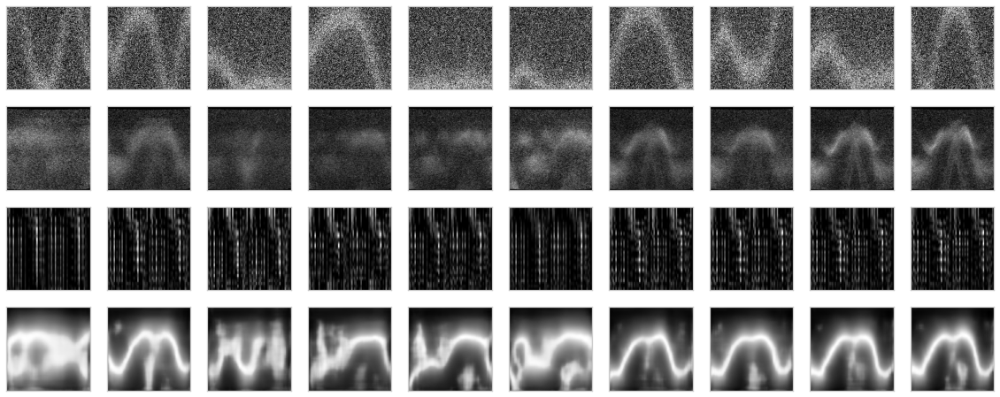

In [ ]:
# x_real = np.array([norm_ln(x) for x in data.data[12]])
x_real = np.array([norm(x) for x in data.data[12]])

# x_real = np.array([norm(x) for x in make_noise(multigen(20,3))])

# x_real = x_test_noisy
x_ground = x_test_noisy

decoded_imgs = autoencoder.predict(x_real)

encoder = keras.Model(input_img, encoded)
encoded_imgs = encoder.predict(x_real)


plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    # Display original

    ax = plt.subplot(4, n, i)
    plt.imshow(x_ground[i].reshape(h, w))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    ax = plt.subplot(4, n, i +n)
    plt.imshow(x_real[i].reshape(h, w))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    ax = plt.subplot(4, n, i+ 2*n)
    plt.imshow(cv2.resize(encoded_imgs[i].reshape((32, 64)), (64,64)))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(4, n, i + 3*n)
    plt.imshow(decoded_imgs[i].reshape(h, w))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()



# Generation of Artificial Stress-Test Data

In [ ]:
def range_gen():
  r = np.random.uniform(4,6)
  s = np.random.uniform(-pi, pi-0.1)
  c = np.random.uniform(-2, 2, 2)
  w = np.random.uniform(0.4,0.6)
  return [[r, r+1], [s, s+0.1], c, [w, w+0.1]]


In [ ]:
def load_artificial(a_layers = 1):
  xmin = 0
  xmax = 31
  ymin = 0
  ymax = 31
  KE_min = 90
  KE_max = 91
  Theta_min = -15
  Theta_max = 15
  n = 6
  arr = []
  for x in range(n):
    layers = np.zeros((150, 128, 128))
    for layer in range(a_layers):
      t = range_gen()
      vals = gen(150, t[0], t[1], t[2], t[3], False)
      layers += vals
    np.clip(layers, 0., 1.)
    arr.append(noisy(layers))

  Count_NP = np.concatenate(np.array(arr), axis = 0)
  print(Count_NP.shape)
  Count_NP = np.reshape(Count_NP, (30, 30, 128, 128))
  return ARPES_data(Count_NP, xmin, xmax, ymin, ymax, KE_min, KE_max, \
              Theta_min, Theta_max)


In [ ]:
from itertools import permutations

gt_artifical = np.reshape(np.array([[0]*150,[1]*150, [2]*150, [3]*150, [4]*150, [5]*150]), (30, 30))

# get similarity between two sorted arrays, trying all the labels first

# Real Data Processing
Note: the K-means and integration algorithms are based on:

*Iwasawa, H., Ueno, T., Masui, T. et al. Unsupervised clustering for identifying spatial inhomogeneity on local electronic structures. npj Quantum Mater. 7, 24 (2022). https://doi.org/10.1038/s41535-021-00407-5*

**Load data: (IMPORTENT: PUT YOUR PATH TO THE .h5 FILE)**

In [ ]:
data = load_text("/content/drive/MyDrive/Apres_Artificial/AkwSimForEric")

In [ ]:
data = load_data('/content/drive/MyDrive/TaSe2_zap_0000.h5', reshape_KE= False, KE = (91.,91.6)) # put path to data here

Beginning to load data...
Reshaping angle bounds...
Data from /content/drive/MyDrive/TaSe2_zap_0000.h5 has been loaded, took 2.45 seconds.


In [ ]:
data = load_data('/content/drive/MyDrive/Tgrad_BSCCO_zap_0001/Tgrad_BSCCO_zap_0000.h5')

Beginning to load data...
Reshaping angle bounds...
Data from /content/drive/MyDrive/Tgrad_BSCCO_zap_0001/Tgrad_BSCCO_zap_0000.h5 has been loaded, took 22.96 seconds.


In [ ]:
data = load_data('/content/drive/MyDrive/Tgrad_BSCCO_zap_0001/Tgrad_BSCCO_zap_0001.h5')

Beginning to load data...
Reshaping angle bounds...
Data from /content/drive/MyDrive/Tgrad_BSCCO_zap_0001/Tgrad_BSCCO_zap_0001.h5 has been loaded, took 14.48 seconds.


In [ ]:
data = load_data('/content/drive/MyDrive/Tgrad_BSCCO_zap_0001/Tgrad_BSCCO_zap_0001.h5', reshape_KE = True, KE = (45.3, 46.))

Beginning to load data...
Reshaping angle bounds...
Reshaping energy bounds...
1064
1793
163
Data from /content/drive/MyDrive/Tgrad_BSCCO_zap_0001/Tgrad_BSCCO_zap_0001.h5 has been loaded, took 1.89 seconds.


In [ ]:
data = load_data('/content/drive/MyDrive/Tgrad_BSCCO_zap_0001/Tgrad_BSCCO_zap_0002.h5')

Beginning to load data...
Reshaping angle bounds...
Data from /content/drive/MyDrive/Tgrad_BSCCO_zap_0001/Tgrad_BSCCO_zap_0002.h5 has been loaded, took 39.63 seconds.


In [ ]:
data = load_artificial()

NameError: ignored

**Below are several basic usages of the code:**

In [ ]:
data.data.shape

(21, 21, 1064, 816)

Create an integrated intensity map in realspace

Formating data for graph...
Drawing graph...


<Figure size 432x432 with 0 Axes>

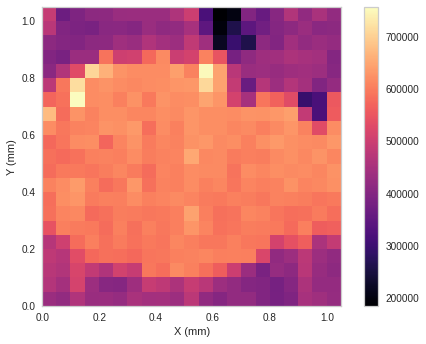

<Figure size 576x396 with 0 Axes>

In [ ]:
data.show()

Show Angle-KE-Intensity distribution of a specified point

Formating data for point (13,5)...
Drawing graph...


<Figure size 432x432 with 0 Axes>

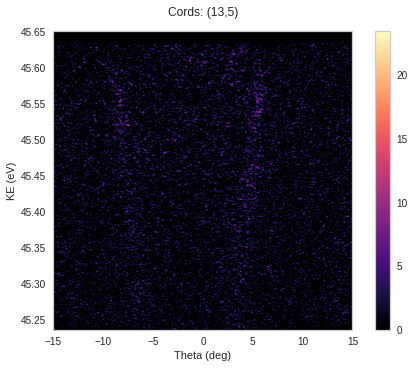

Formating decoding for point (13,5)...
Drawing graph...


<Figure size 576x396 with 0 Axes>

<Figure size 432x432 with 0 Axes>

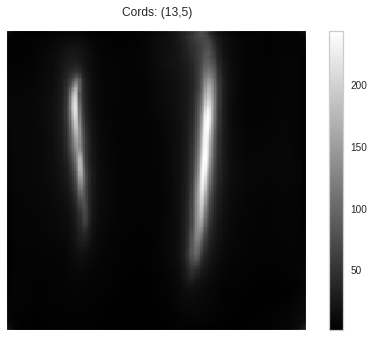

<Figure size 576x396 with 0 Axes>

In [ ]:
data.show_point(13,5)
# data.show_encoding(15,6)
data.show_decoding(13, 5, enhance = True)

Integrate energy/angle densities

In [ ]:
data.show_autoencode(enhance = True)

Formatting data for autoencoding...
Autoencoding data...
Drawing graph...


<Figure size 432x432 with 0 Axes>

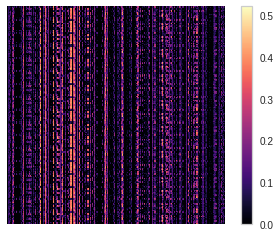

<Figure size 432x288 with 0 Axes>

In [ ]:
data.show_autoencode(enhance = True)

Formatting data for energy...
Integrating energy...
Drawing graph...


<Figure size 432x432 with 0 Axes>

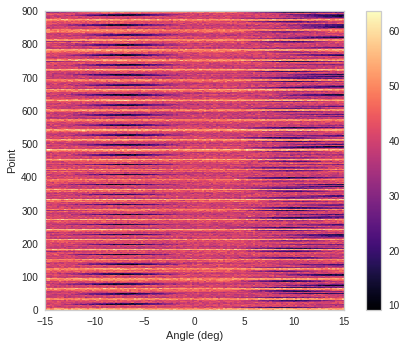

Formatting data for angle...
Integrating angle...
Drawing graph...


<Figure size 576x396 with 0 Axes>

<Figure size 432x432 with 0 Axes>

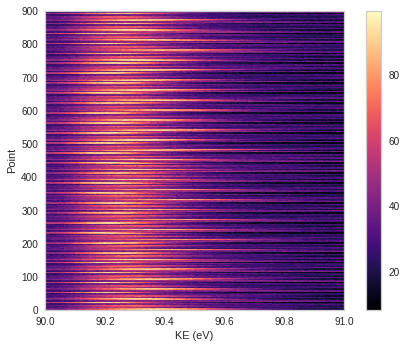

<Figure size 576x396 with 0 Axes>

In [ ]:
data.show_energy()
data.show_angle()

Create elbow diagrams via. yellowbrick

Visualising elbow method for 'autoencoder'...
Autoencoding data...


/usr/local/lib/python3.7/dist-packages/yellowbrick/utils/kneed.py:155: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
/usr/local/lib/python3.7/dist-packages/yellowbrick/cluster/elbow.py:361: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


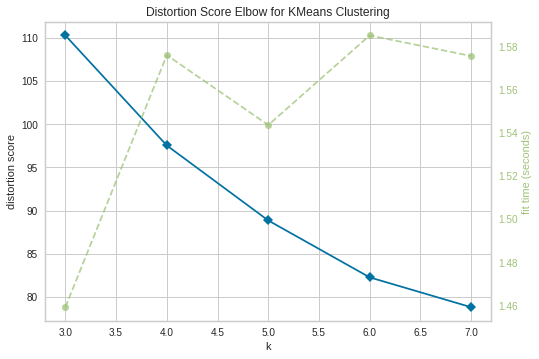

In [ ]:
# data.elbow('angle')
# data.elbow('energy')
# data.elbow('PCA', range=(3,8))
data.elbow('autoencoder', range=(3,8), enhance = True)


---
K-Means Clustering and KNN based point data extrapolation



In [ ]:
data.silhouette('angle')
data.silhouette('energy')
data.silhouette('PCA')
data.silhouette('autoencoder')

Direct Clustering Straight from Data:

Autoencoding data...
Beginning kmeans clustering, type is autoencoder...
Kmeans clustering complete, took 2.12 seconds.
Drawing graph...


<Figure size 432x432 with 0 Axes>

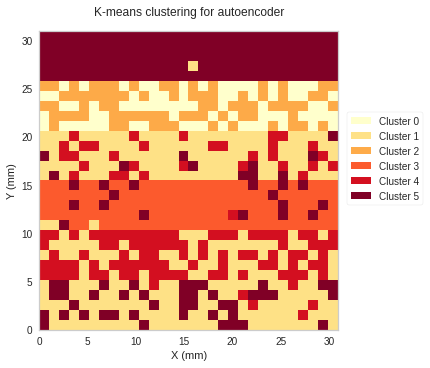

<Figure size 576x396 with 0 Axes>

In [ ]:
data.show_kmeans('autoencoder', 6, smooth = False, enhance = False)

Beginning PCA...
PCA reduction complete, took 8.7 seconds.
Beginning kmeans clustering, type is PCA...
Kmeans clustering complete, took 1.65 seconds.
Drawing graph...


<Figure size 432x432 with 0 Axes>

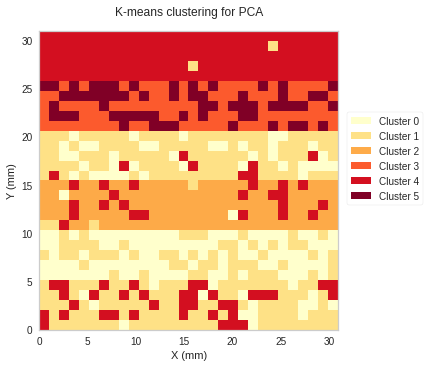

Integrating angle...
Beginning kmeans clustering, type is angle...
Kmeans clustering complete, took 1.69 seconds.
Drawing graph...


<Figure size 576x396 with 0 Axes>

<Figure size 432x432 with 0 Axes>

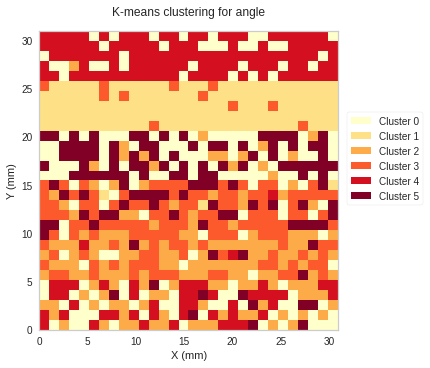

Integrating energy...
Beginning kmeans clustering, type is energy...
Kmeans clustering complete, took 1.55 seconds.
Drawing graph...


<Figure size 576x396 with 0 Axes>

<Figure size 432x432 with 0 Axes>

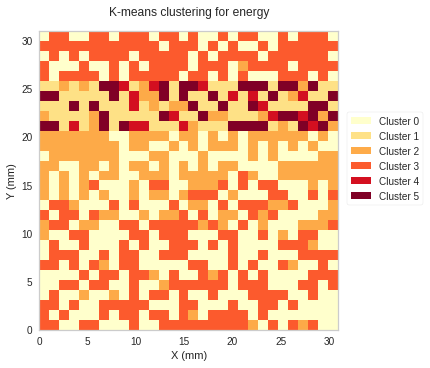

<Figure size 576x396 with 0 Axes>

In [ ]:
data.show_kmeans('PCA', 6, smooth = False)
data.show_kmeans('angle', 6, smooth = False)
data.show_kmeans('energy', 6,smooth = False)

# Create a Clustered Object (Saves computation time)

In [ ]:
data = load_artificial(3)

(900, 128, 128, 1)


In [ ]:
clust = data.kmeans('PCA', 5)
# clust.get_accuracy(gt_artifical)

Beginning PCA...
PCA reduction complete, took 6.6 seconds.
Beginning kmeans clustering, type is PCA...
Kmeans clustering complete, took 1.15 seconds.


In [ ]:
clust = data.kmeans('energy', 6, enhance = False)
# clust.get_accuracy(gt_artifical)

Integrating energy...
Beginning kmeans clustering, type is energy...
Kmeans clustering complete, took 1.41 seconds.


In [ ]:
clust = data.kmeans('angle', 6, enhance = False)
# clust.get_accuracy(gt_artifical)

Integrating angle...
Beginning kmeans clustering, type is angle...
Kmeans clustering complete, took 1.55 seconds.


In [ ]:
clust = data.kmeans('autoencoder', 4, enhance = True)
# clust.get_accuracy(gt_artifical)

Autoencoding data...
Beginning kmeans clustering, type is autoencoder...
Kmeans clustering complete, took 1.6 seconds.


In [ ]:
c = clust.zerocount(1,0.4)


In [ ]:
get_fermi(data.data[13,5])

36

In [ ]:
print(c)

[[ 0.  0.  0.  0.  0.  0. 43. 59. 33. 41. 35. 45. 33. 40. 39. 40.  0.  0.
   0.  0.  0.]
 [ 0.  0.  0.  0.  0. 48. 37. 40. 39. 41. 44. 41. 36. 35. 24. 33.  0.  0.
   0.  0.  0.]
 [ 0.  0.  0.  0. 56. 31. 45. 49. 41. 41. 44. 43. 53. 44. 32. 31. 31.  0.
   0.  0.  0.]
 [ 0.  0.  0.  0. 47. 44. 41. 44. 44. 43. 40. 47. 33. 41. 39. 29. 33. 36.
   0.  0.  0.]
 [ 0.  0.  0.  0.  0. 55. 33. 33. 36.  0.  0. 43. 31. 51. 36. 39. 36. 31.
   0.  0.  0.]
 [ 0.  0.  0.  0. 41. 47. 44. 35. 32. 29. 44. 33. 41. 33. 41. 40. 40. 43.
   0.  0.  0.]
 [ 0.  0.  0. 47. 37. 31. 43. 39. 20. 39. 43. 39. 40. 43. 39. 43. 36. 40.
   0.  0.  0.]
 [ 0.  0.  0.  0. 40. 44. 33. 32. 47. 41. 40. 51.  0. 32. 37. 39. 36. 37.
  37.  0.  0.]
 [ 0.  0.  0. 44. 43. 44. 41. 39. 33. 43. 33. 37. 35. 39. 43. 37. 44. 40.
  40.  0.  0.]
 [ 0.  0.  0.  0. 33. 45. 45. 44. 43. 31. 29. 31. 32. 39. 37. 41. 45. 39.
  33.  0.  0.]
 [ 0.  0.  0.  0. 41. 40. 45. 43. 40. 33. 31. 33. 29. 37. 45. 44. 37. 21.
  41.  0.  0.]
 [ 0.  0.  0. 53.  0.

In [ ]:
  def plot_graph(values, xlabel, ylabel, ext, xbins=6, ybins=6, \
                 interpolation = "lanczos", aspect=1, cmap = "magma",\
                 title = "", pad = 0, Autosquare = False, cbar = True, show = True,
                 axis = True): 

In [ ]:
c = np.array([[ 0.,  0.,  0.,  0.,  0.,  0., 43., 59., 33., 41., 35., 45., 33., 40., 39., 40.,  0.,  0., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0.,  0., 48., 37., 40., 39., 41., 44., 41., 36., 35., 24., 33.,  0.,  0., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0., 56., 31., 45., 49., 41., 41., 44., 43., 53., 44., 32., 31., 31.,  0., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0., 47., 44., 41., 44., 44., 43., 40., 47., 33., 41., 39., 29., 33., 36., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0.,  0., 55., 33., 33., 36.,  0.,  0., 43., 31., 51., 36., 39., 36., 31., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0., 41., 47., 44., 35., 32., 29., 44., 33., 41., 33., 41., 40., 40., 43., 0.,  0.,  0.],\
     [ 0.,  0.,  0., 47., 37., 31., 43., 39., 20., 39., 43., 39., 40., 43., 39., 43., 36., 40., 0.,  0.,  0.],\
     [ 0.,  0.,  0., 44., 43., 44., 41., 39., 33., 43., 33., 37., 35., 39., 43., 37., 44., 40., 40.,  0.,  0.],\
     [ 0.,  0.,  0.,  0., 33., 45., 45., 44., 43., 31., 29., 31., 32., 39., 37., 41., 45., 39., 33.,  0.,  0.],\
     [ 0.,  0.,  0.,  0., 41., 40., 45., 43., 40., 33., 31., 33., 29., 37., 45., 44., 37., 21., 41.,  0.,  0.],\
     [ 0.,  0.,  0., 53.,  0.,  0., 32., 36., 29., 37., 41., 35., 36., 41., 29., 25., 33., 32., 37.,  0.,  0.],\
     [ 0.,  0.,  0., 55., 39., 43., 40., 35., 39., 36., 28., 41., 39., 36., 32., 35., 37., 41., 41.,  0.,  0.],\
     [ 0.,  0.,  0.,  0.,  0.,  0.,  0., 31., 39., 39., 27., 44., 40., 39., 39., 35., 33., 28., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0.,  0.,  0.,  0., 45., 44., 41., 41., 39., 41., 35., 33., 33., 44., 36., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0.,  0.,  0., 43., 29., 41., 44., 35., 29., 37., 43., 35., 31., 43.,  0., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0.,  0.,  0., 49., 32., 31., 43., 41., 39., 43., 41., 40., 48.,  0.,  0., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0.,  0.,  0.,  0., 32., 39., 35., 39., 36., 29., 37., 36., 35., 40.,  0., 0.,  0.,  0,],\
     [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 37., 39., 39., 37., 32., 37., 29., 39., 45.,  0., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 45., 31., 28., 37., 37., 44., 39., 47.,  0.,  0., 0.,  0.,  0.],\
     [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 31., 23., 40., 27., 39., 40.,  0., 52.,  0.,  0., 0.,  0.,  0.]])

Drawing graph...


<Figure size 432x432 with 0 Axes>

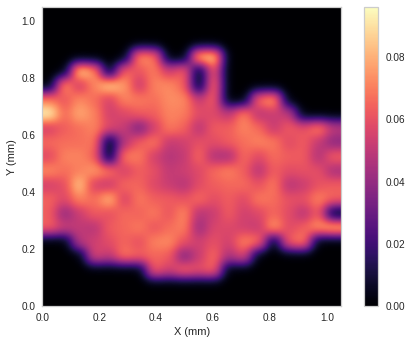

<Figure size 576x396 with 0 Axes>

In [ ]:
data.plot_graph(c.T*0.00162617, "X (mm)", "Y (mm)", [0, 1.05, 0, 1.05], interpolation = 'gaussian')

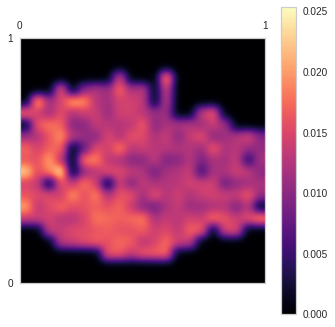

In [ ]:
plt.matshow(c.T*3.9*0.0001, cmap = 'magma', interpolation = 'gaussian', extent = [0, 1, 0, 1])
plt.grid('off')
plt.colorbar()

In [ ]:
cords = clust.PCA_on_autoencoder(0)
plt.matshow(np.reshape(cords, (data.x_s,data.y_s)).T, cmap='magma')

In [ ]:
print(pcaed.explained_variance_ratio_)

Finding representative points...
Plotting...


<Figure size 720x432 with 0 Axes>

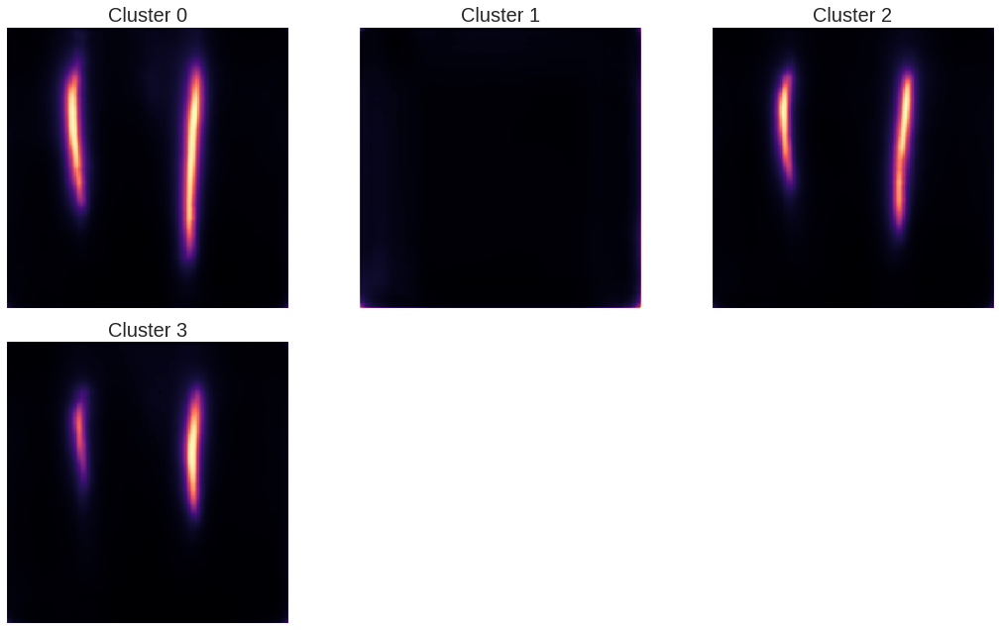

In [ ]:
clust.show_centers(True, True)

In [ ]:
t = clust.ARPES.data
t.shape

(21, 21, 1064, 816)

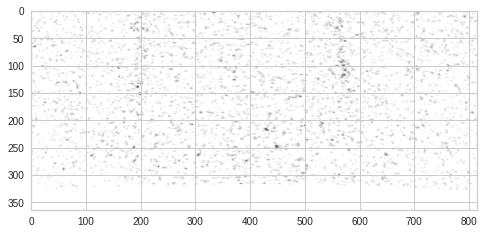

In [ ]:
plt.imshow(t[5,5][700:1064, :])

Drawing graph...


<Figure size 432x432 with 0 Axes>

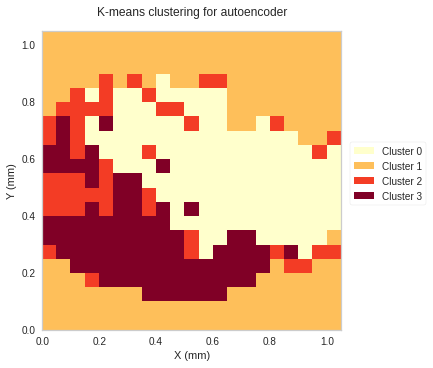

<Figure size 576x396 with 0 Axes>

In [ ]:
clust.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


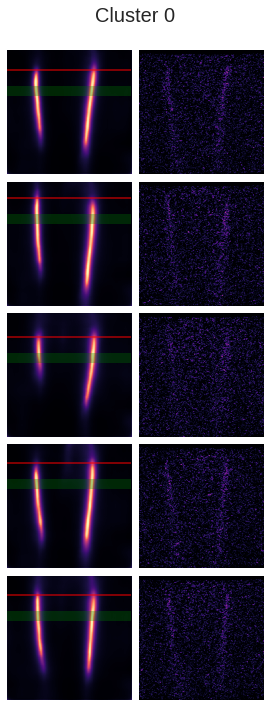

<Figure size 576x396 with 0 Axes>

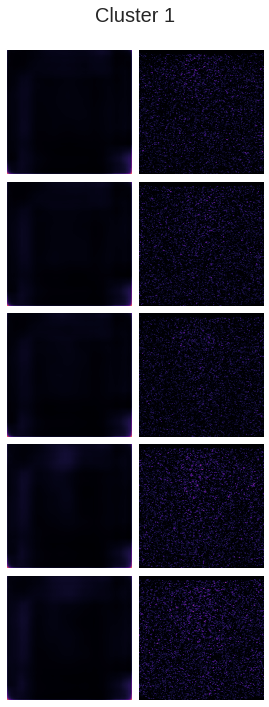

<Figure size 576x396 with 0 Axes>

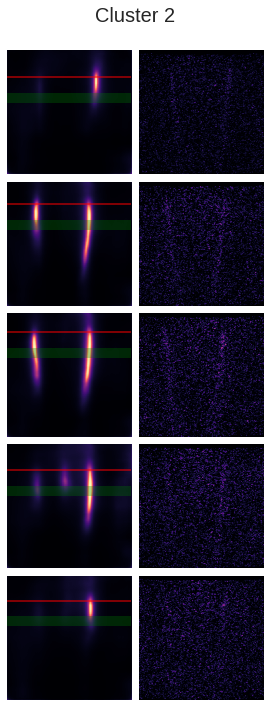

<Figure size 576x396 with 0 Axes>

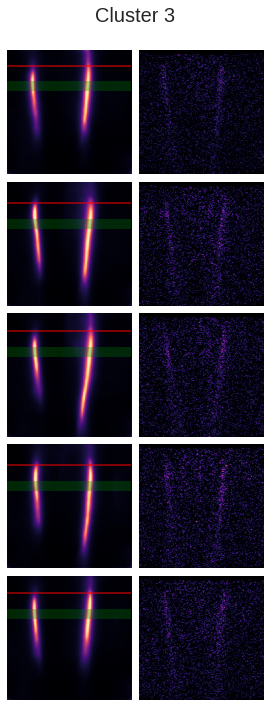

<Figure size 576x396 with 0 Axes>

In [ ]:
clust.show_double_cluster(0, enhance = True, epsilon = 0.5)
clust.show_double_cluster(1, enhance = True, line = False, epsilon = 0.5)
clust.show_double_cluster(2, enhance = True, epsilon = 0.5)
clust.show_double_cluster(3, enhance = True, epsilon = 0.5)
# clust.show_double_cluster(3, enhance = True)
# clust.show_double_cluster(3, enhance = True)

Getting cluster 0...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:178: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


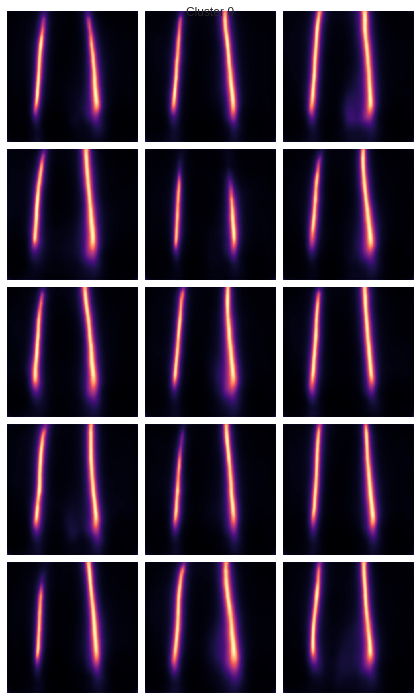

Getting cluster 1...


<Figure size 576x396 with 0 Axes>

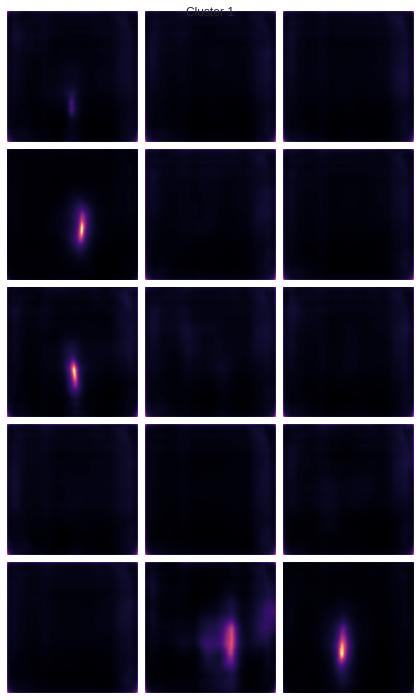

Getting cluster 2...


<Figure size 576x396 with 0 Axes>

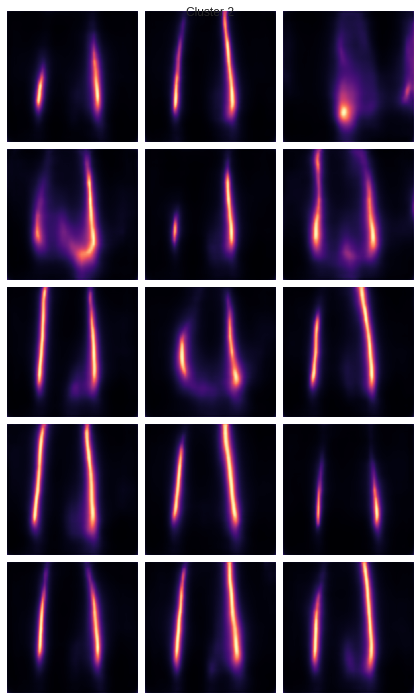

<Figure size 576x396 with 0 Axes>

In [ ]:
clust.show_cluster(0, encode = True, enhance = True)
clust.show_cluster(1, encode = True, enhance = True)
clust.show_cluster(2, encode = True, enhance = True)


Getting cluster 0...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:149: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


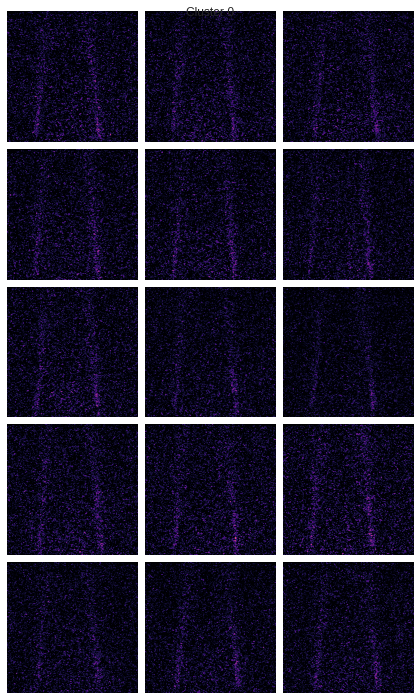

Getting cluster 1...


<Figure size 576x396 with 0 Axes>

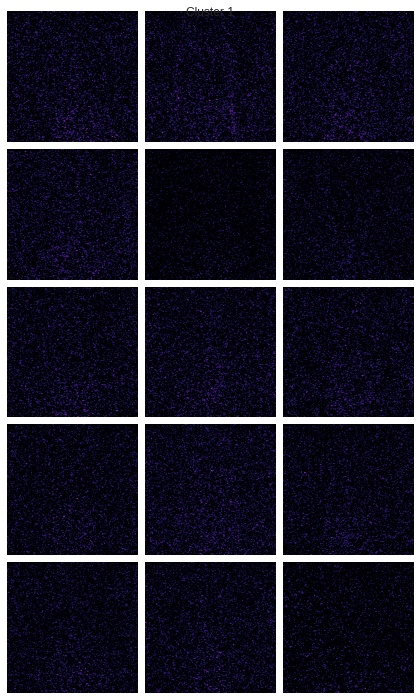

Getting cluster 2...


<Figure size 576x396 with 0 Axes>

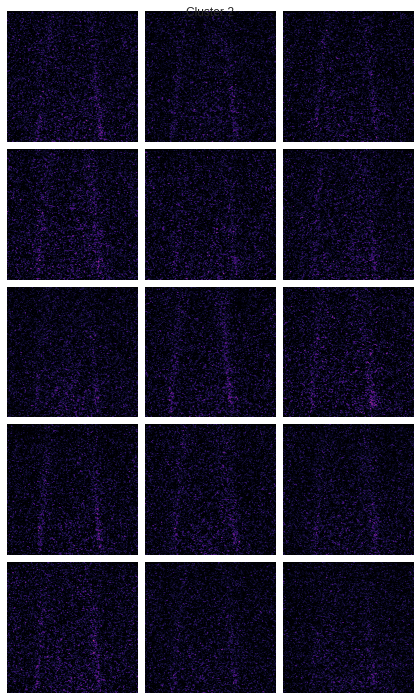

Getting cluster 3...
Cluster is out of range.


<Figure size 576x396 with 0 Axes>

In [ ]:
clust.show_cluster(0, enhance = True)
clust.show_cluster(1, enhance = True)
clust.show_cluster(2, enhance = True)
clust.show_cluster(3, enhance = True)

In [ ]:
clust.show_distribution()

Accounting for 0.7405616183092691 of varience.


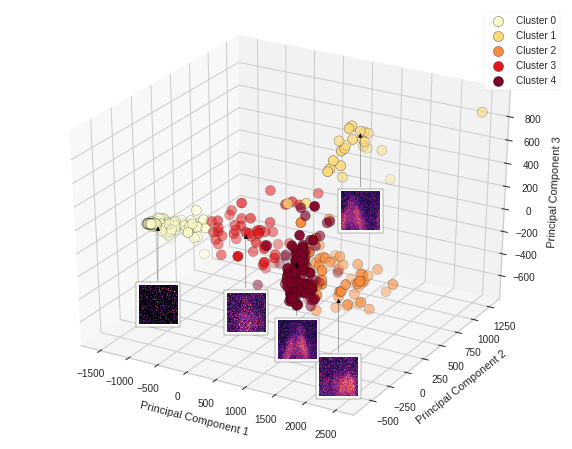

In [ ]:
clust.show_3d(show_cent=True)

In [ ]:
clust.show_accr

In [ ]:
print(np.reshape(clust.labels, (30, 30), order = 'F'))

[[5 5 0 5 5 5 0 5 5 5 5 5 5 5 5 5 5 5 5 5 0 5 5 5 5 5 0 5 0 5]
 [0 5 5 5 5 5 5 0 0 0 5 5 5 5 5 5 5 5 0 5 5 5 5 5 5 0 5 0 5 5]
 [5 5 0 5 5 5 5 5 5 5 5 5 5 5 0 0 5 0 5 5 5 5 5 5 5 5 5 5 5 5]
 [5 0 5 5 5 5 0 5 5 5 5 0 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]
 [5 5 5 5 5 5 5 0 5 5 5 5 5 5 0 0 5 5 5 5 5 5 5 5 5 5 0 5 5 5]
 [3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 2 2 3 3 3 3 3 3 3 3 3 3 3 2 3]
 [3 3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 3 3]
 [3 3 3 3 3 3 3 2 3 3 3 3 3 3 3 3 2 3 3 3 2 3 3 3 3 3 3 3 3 3]
 [2 3 3 3 3 3 3 3 3 2 3 3 3 3 2 3 3 3 3 3 3 2 3 3 3 3 2 3 3 3]
 [3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 3 3 3]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 4 2 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 2 3 2 2 2 2